In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
import warnings
warnings.filterwarnings("ignore")
import librosa
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import pickle
from scipy.stats import gaussian_kde

2025-05-20 06:31:56.797413: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-20 06:31:56.807755: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747693916.818005   44259 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747693916.821072   44259 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747693916.831846   44259 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
# --- Load Model ---
with open('results/CNN_model.json', 'r') as json_file:
    loaded_model_json = json_file.read()

# Load the model architecture
loaded_model = tf.keras.models.model_from_json(loaded_model_json)

# Load the model weights
loaded_model.load_weights("results/best_model.weights.h5")

# --- Compile the Model (important for layer extraction) ---
loaded_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# --- Load Scaler & Encoder ---
with open("results/scaler.pickle", "rb") as f:
    scaler = pickle.load(f)
with open("results/encoder.pickle", "rb") as f:
    encoder = pickle.load(f)


2025-05-20 06:32:00.596483: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-05-20 06:32:00.596504: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:167] env: CUDA_VISIBLE_DEVICES="-1"
2025-05-20 06:32:00.596509: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:170] CUDA_VISIBLE_DEVICES is set to -1 - this hides all GPUs from CUDA
2025-05-20 06:32:00.596512: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:178] verbose logging is disabled. Rerun with verbose logging (usually --v=1 or --vmodule=cuda_diagnostics=1) to get more diagnostic output from this module
2025-05-20 06:32:00.596515: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:183] retrieving CUDA diagnostic information for host: aegis-Thin-GF63-12UCX
2025-05-20 06:32:00.596516: I external/local_xla/xla/stream_execu

In [3]:
# --- Feature Extraction (same as in Part 3) ---
def zcr(data, frame_length, hop_length):
    return np.squeeze(librosa.feature.zero_crossing_rate(data, frame_length=frame_length, hop_length=hop_length))

def rmse(data, frame_length=2048, hop_length=512):
    return np.squeeze(librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length))

def mfcc(data, sr, frame_length=2048, hop_length=512, flatten=True):
    mfcc_result = librosa.feature.mfcc(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(mfcc_result.T) if not flatten else np.ravel(mfcc_result.T)

def extract_features(data, sr=22050, frame_length=2048, hop_length=512):
    return np.hstack((zcr(data, frame_length, hop_length),
                      rmse(data, frame_length, hop_length),
                      mfcc(data, sr, frame_length, hop_length)))

def get_predict_feat(path, expected_shape=(1, 2376)):
    d, s_rate = librosa.load(path, duration=2.5, offset=0.6)
    res = extract_features(d)
    flat_size = np.prod(expected_shape)
    if res.size < flat_size:
        res = np.pad(res, (0, flat_size - res.size), mode='constant')
    else:
        res = np.resize(res, expected_shape)
    i_result = scaler.transform(res.reshape(1, -1))
    return np.expand_dims(i_result, axis=2)


def plot_activation_map(audio_path, emotion_name, layer_name="conv1d"):
    processed_input = get_predict_feat(audio_path)
    
    # Ensure the model is called to initialize input/output
    _ = loaded_model(processed_input)
    
    activation_model = Model(inputs=loaded_model.inputs,
                             outputs=loaded_model.get_layer(layer_name).output)
    activations = activation_model.predict(processed_input)
    mean_activation = np.mean(activations[0], axis=-1)

    plt.figure(figsize=(10, 4))
    plt.plot(mean_activation)
    plt.title(f"{emotion_name.capitalize()} - Activation Map ({layer_name})")
    plt.xlabel("Time Steps")
    plt.ylabel("Mean Activation")
    plt.tight_layout()
    plt.show()

def plot_activation_map_2d(audio_path, emotion_name, layer_name="conv1d"):
    processed_input = get_predict_feat(audio_path)
    activation_model = Model(inputs=loaded_model.inputs,
                             outputs=loaded_model.get_layer(layer_name).output)
    activations = activation_model.predict(processed_input)
    activation_map = activations[0].T  # Shape: (filters, time_steps)

    plt.figure(figsize=(12, 6))
    plt.imshow(activation_map, aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(label='Activation Strength')
    plt.title(f"Activation Map — {emotion_name}")
    plt.xlabel("Time Steps")
    plt.ylabel("Filter Index")
    plt.tight_layout()
    plt.show()
    
def prediction(path1):

    res = get_predict_feat(path1)
    predictions = loaded_model.predict(res)

    # Get the label names or define them if available
    label_names = list(encoder.categories_[0])

    # Get the index of the label with the highest confidence score
    predicted_label_index = np.argmax(predictions)

    # List to store confidence scores
    confidence_scores = []

    # Display predicted emotion and confidence for each label
    print(f"\nPredicted Emotion: {label_names[predicted_label_index]}")
#     predicted_emo.append(label_names[predicted_label_index])
    for label_index, label_name in enumerate(label_names):
        confidence_score = predictions[0][label_index]
        confidence_score = 0 if confidence_score < 0.001 else confidence_score
        confidence_scores.append({'label': label_name, 'confidence': confidence_score})

    print("\n")

    sorted_confidence_scores = sorted(confidence_scores, key=lambda x: x['confidence'], reverse=True)

    return sorted_confidence_scores

def visualize_features(data, sr, frame_length=2048, hop_length=512, n_mels=128, fmax=8000):
    """
    Visualizes Mel Spectrogram, Zero Crossing Rate, and RMS Energy of an audio signal.

    Parameters:
        data (np.ndarray): Audio time series.
        sr (int): Sampling rate of the audio.
        frame_length (int): Length of each frame for analysis.
        hop_length (int): Number of samples between successive frames.
        n_mels (int): Number of Mel bands.
        fmax (int): Maximum frequency for the Mel spectrogram.
    """
    
    # Compute features
    mel_spec = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=n_mels, fmax=fmax)
    log_mel_spec = librosa.power_to_db(mel_spec, ref=np.max)
    zcr = librosa.feature.zero_crossing_rate(y=data, frame_length=frame_length, hop_length=hop_length)[0]
    rms = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)[0]
    times = librosa.times_like(zcr, sr=sr, hop_length=hop_length)

    # Plotting
    fig, axs = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

    # Mel Spectrogram
    img = librosa.display.specshow(log_mel_spec, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', fmax=fmax, ax=axs[0])
    axs[0].set(title='Mel Spectrogram')
    fig.colorbar(img, ax=axs[0], format='%+2.0f dB')
    axs[0].grid(True)

    # Zero Crossing Rate
    axs[1].plot(times, zcr, color='r', label='ZCR')
    axs[1].plot(times, rms, color='g', label='RMS Energy')
    axs[1].set(title='ZRC and RMSE', xlabel='Time (s)')
    axs[1].legend()
    axs[1].grid(True)


    plt.tight_layout()
    plt.show()


In [4]:
loaded_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 2376, 512)      │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2376, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 1188, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 1188, 512)      │     1,311,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1188, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 594, 512)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 594, 512)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 594, 256)       │       655,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 594, 256)       │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 297, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 297, 256)       │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 297, 256)       │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 149, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 149, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 149, 128)       │        98,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 149, 128)       │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 75, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 75, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,915,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         3,59

 Total params: 7,193,223 (27.44 MB)

 Trainable params: 7,188,871 (27.42 MB)

 Non-trainable params: 4,352 (17.00 KB)

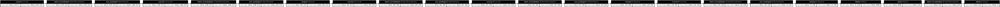

In [24]:
from tensorflow.keras.utils import plot_model

plot_model(loaded_model, to_file='model_dense.png', 
           show_shapes=True, 
           show_layer_names=True, 
           rankdir='LR')  # Left to right, more compact


In [6]:
# # --- Example Usage ---
emotion_audio_files = {
    "happy": "Datasets/TESS/YAF_happy/YAF_back_happy.wav",
    "sad": "Datasets/TESS/YAF_sad/YAF_back_sad.wav",
    "angry": "Datasets/TESS/YAF_angry/YAF_back_angry.wav",
    "fear": "Datasets/TESS/YAF_fear/YAF_back_fear.wav",
    "disgust": "Datasets/TESS/YAF_disgust/YAF_back_disgust.wav",
    "surprise": "Datasets/TESS/YAF_pleasant_surprised/YAF_back_ps.wav",
    "neutral": "Datasets/TESS/YAF_neutral/YAF_back_neutral.wav"
}

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


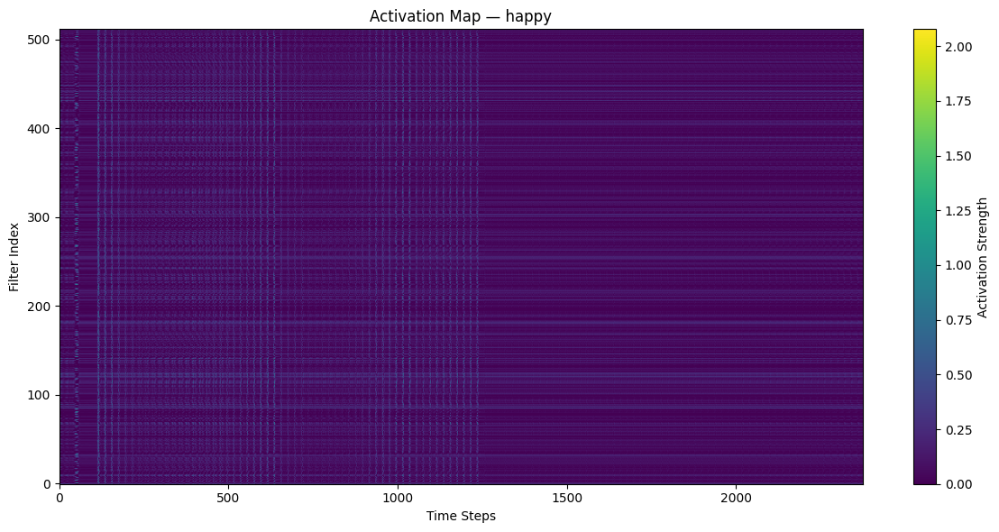

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


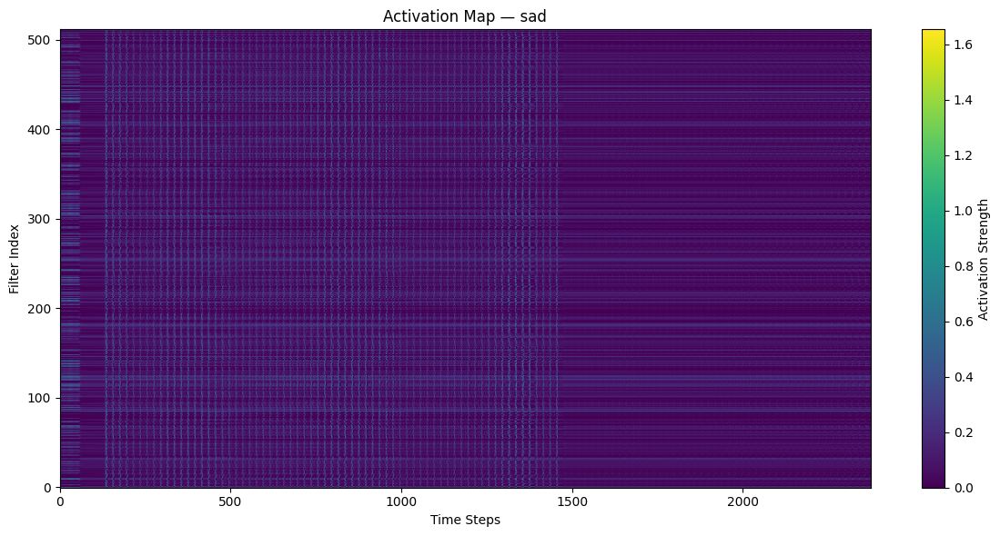

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


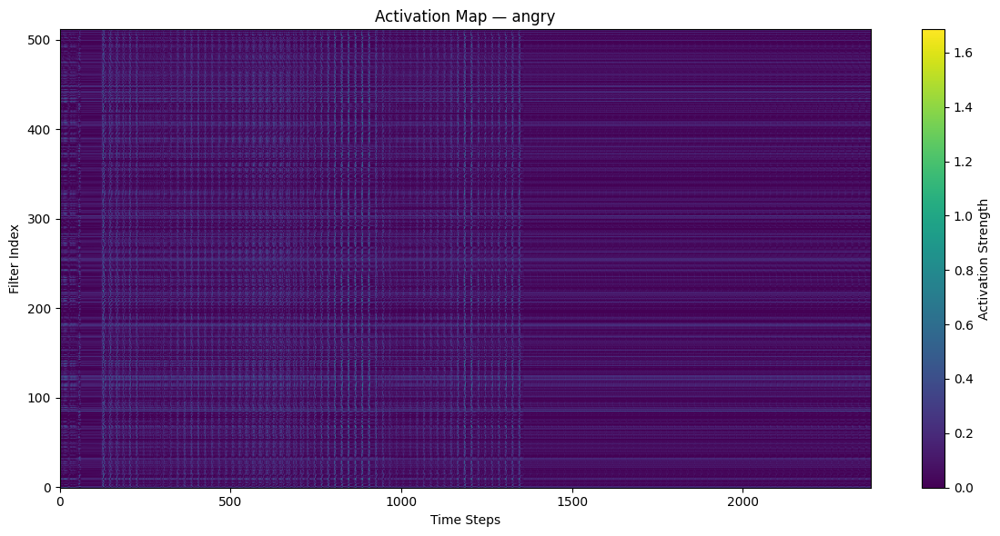

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


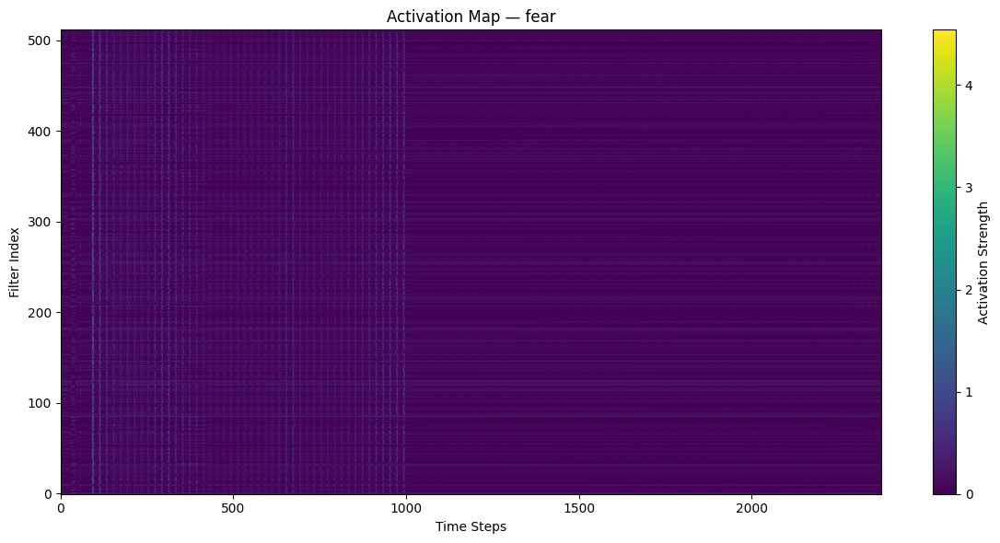

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


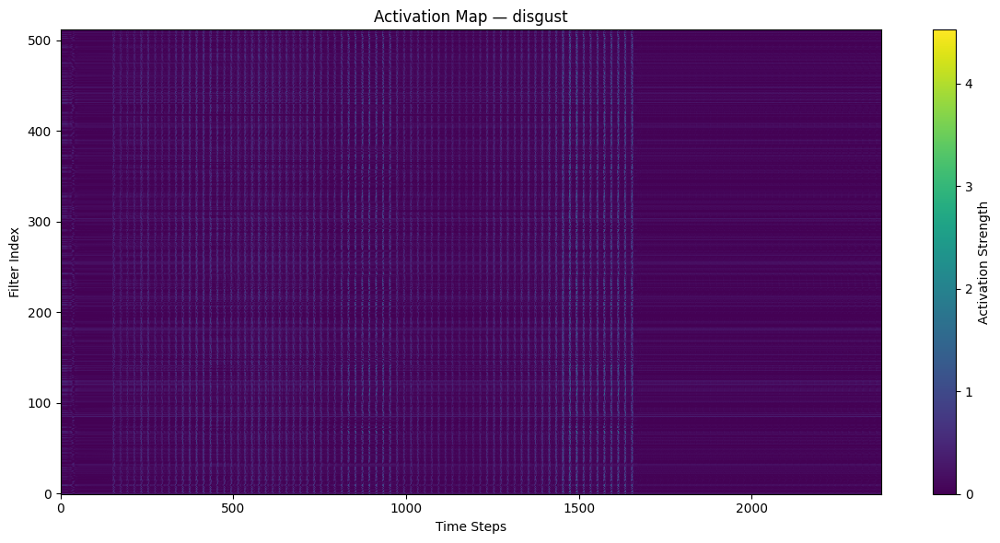

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


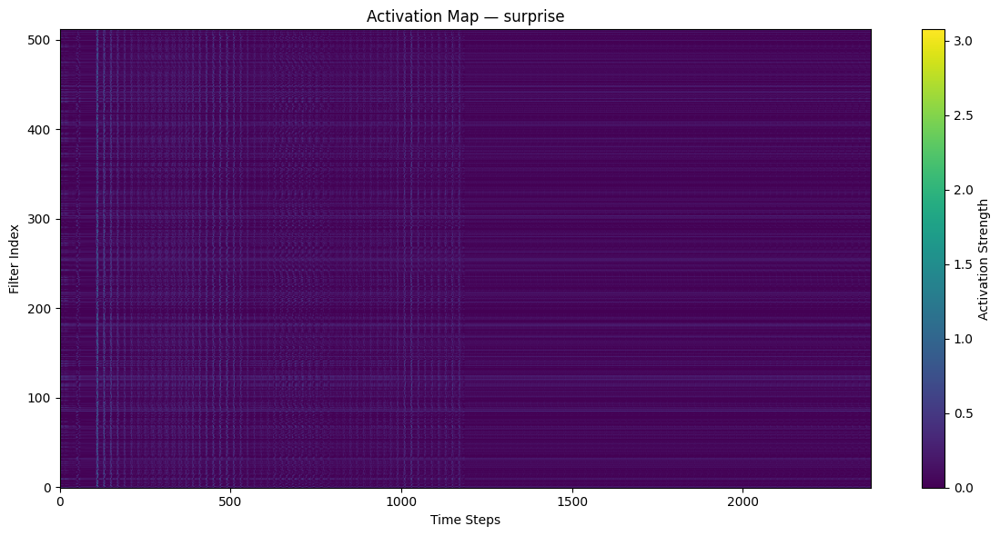

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


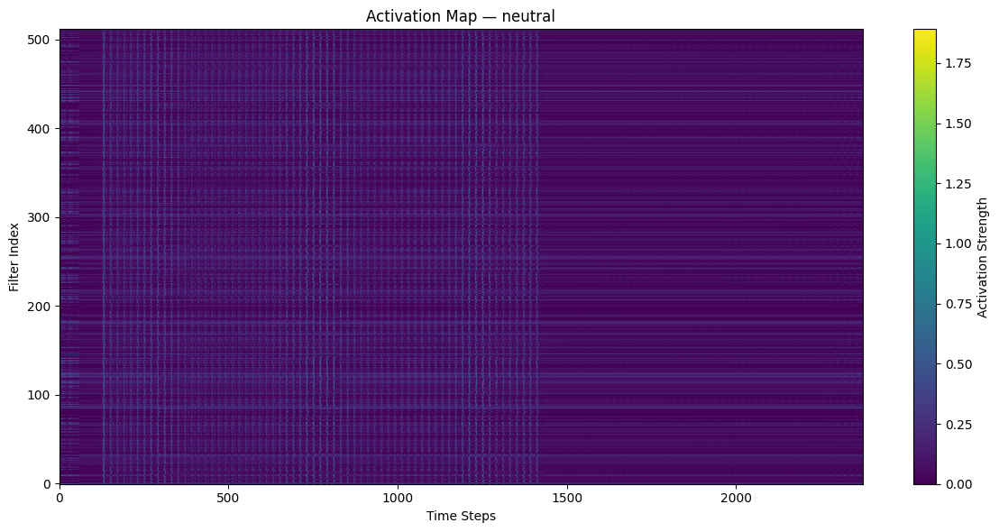

In [7]:
for emotion, path in emotion_audio_files.items():
    plot_activation_map_2d(path, emotion)


(1, 2376, 1)


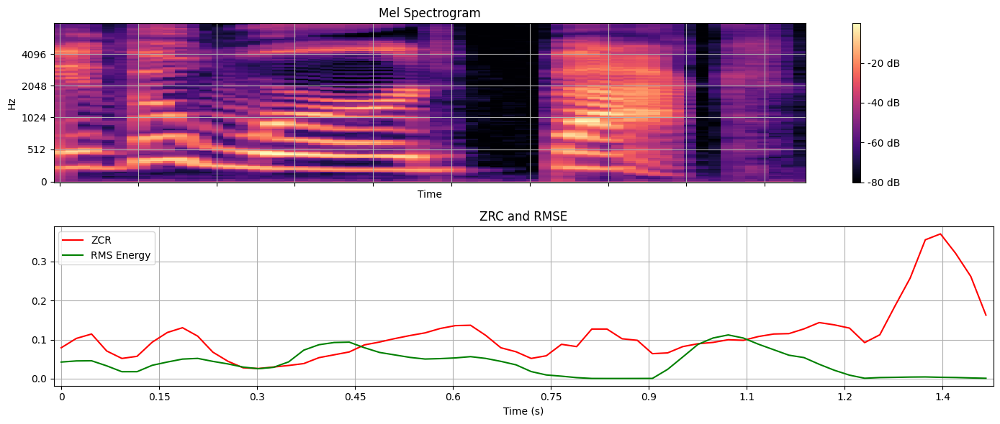

In [8]:
int_dataa = get_predict_feat(emotion_audio_files['angry'])
d, s_rate = librosa.load(emotion_audio_files['angry'], duration=2.5, offset=0.6)
print(int_dataa.shape)
visualize_features(d, s_rate)

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def compute_saliency_map(model, input_tensor):
    input_tensor = tf.convert_to_tensor(input_tensor, dtype=tf.float32)
    input_tensor = tf.Variable(input_tensor)

    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        predictions = model(input_tensor)
        pred_index = tf.argmax(predictions[0])
        top_class = predictions[:, pred_index]

    grads = tape.gradient(top_class, input_tensor)
    saliency = tf.abs(grads)[0]  # shape: (2376, 1)
    saliency = tf.reduce_mean(saliency, axis=-1).numpy()  # shape: (2376,)
    return saliency, pred_index.numpy(), predictions.numpy()[0]

def plot_saliency_map(audio_path, model, class_names):
    input_tensor = get_predict_feat(audio_path)  # shape: (1, 2376, 1)
    saliency, pred_class, pred_probs = compute_saliency_map(model, input_tensor)

    times = np.linspace(0, 1, len(saliency))

    # Perform KDE with saliency values as weights
    kde = gaussian_kde(times, weights=saliency, bw_method=0.05)
    kde_vals = kde(times)

    # Scale KDE to match saliency range
    kde_vals_scaled = kde_vals / np.max(kde_vals) * np.max(saliency)

    plt.figure(figsize=(14, 5))
    plt.plot(times, saliency, label='Saliency', color='red', alpha=0.5)
    plt.fill_between(times, saliency, color='red', alpha=0.3)
    plt.plot(times, kde_vals_scaled, label='KDE Fit (scaled)', color='blue', linewidth=2)

    plt.title(f"Saliency Map for Emotion: {class_names[pred_class]} ({pred_probs[pred_class]*100:.1f}%)")
    plt.xlabel("Time (s)")
    plt.ylabel("Importance")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    np.savez(f"KDE_vals/{class_names[pred_class]}.npz", time=times, kde_scaled=kde_vals_scaled)

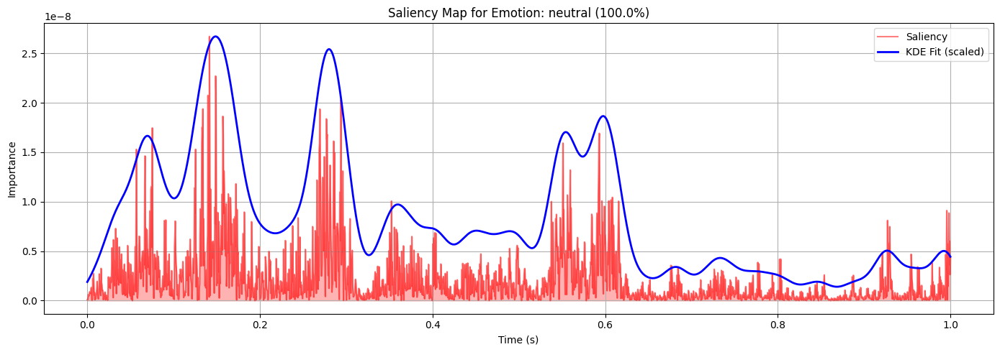

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step

Predicted Emotion: neutral




[{'label': 'neutral', 'confidence': 1.0},
 {'label': 'angry', 'confidence': 0},
 {'label': 'disgust', 'confidence': 0},
 {'label': 'fear', 'confidence': 0},
 {'label': 'happy', 'confidence': 0},
 {'label': 'sad', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [10]:
class_names = list(encoder.categories_[0])

plot_saliency_map(emotion_audio_files['neutral'], loaded_model, class_names)
prediction(emotion_audio_files['neutral'])

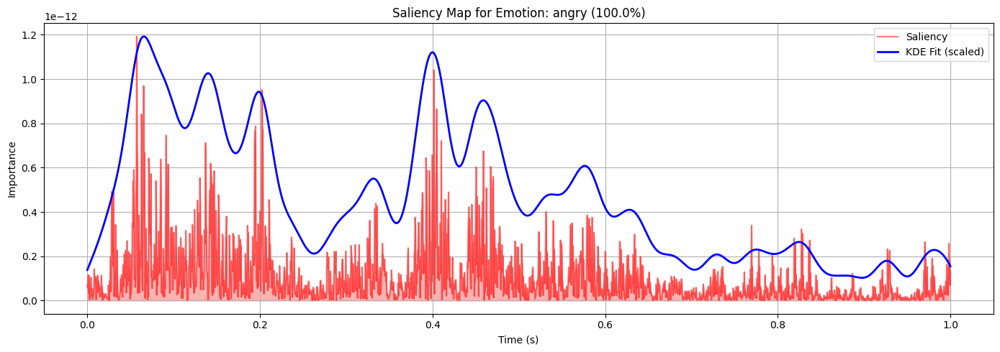

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

Predicted Emotion: angry




[{'label': 'angry', 'confidence': 1.0},
 {'label': 'disgust', 'confidence': 0},
 {'label': 'fear', 'confidence': 0},
 {'label': 'happy', 'confidence': 0},
 {'label': 'neutral', 'confidence': 0},
 {'label': 'sad', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [11]:
plot_saliency_map(emotion_audio_files['angry'], loaded_model, class_names)
prediction(emotion_audio_files['angry'])

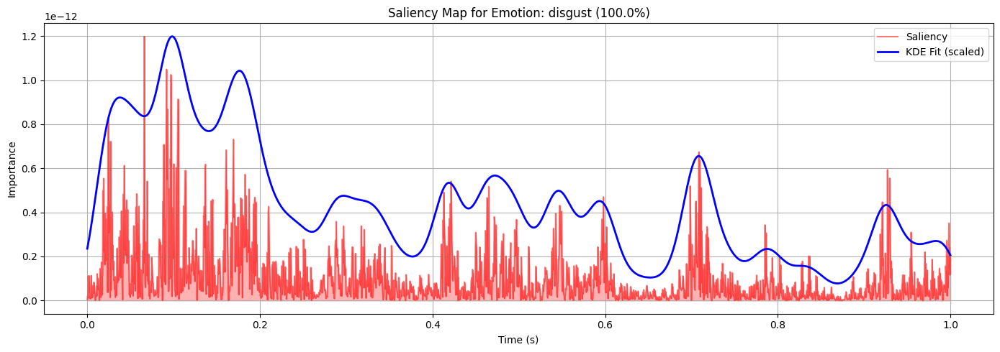

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step

Predicted Emotion: disgust




[{'label': 'disgust', 'confidence': 1.0},
 {'label': 'angry', 'confidence': 0},
 {'label': 'fear', 'confidence': 0},
 {'label': 'happy', 'confidence': 0},
 {'label': 'neutral', 'confidence': 0},
 {'label': 'sad', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [12]:
plot_saliency_map(emotion_audio_files['disgust'], loaded_model, class_names)
prediction(emotion_audio_files['disgust'])

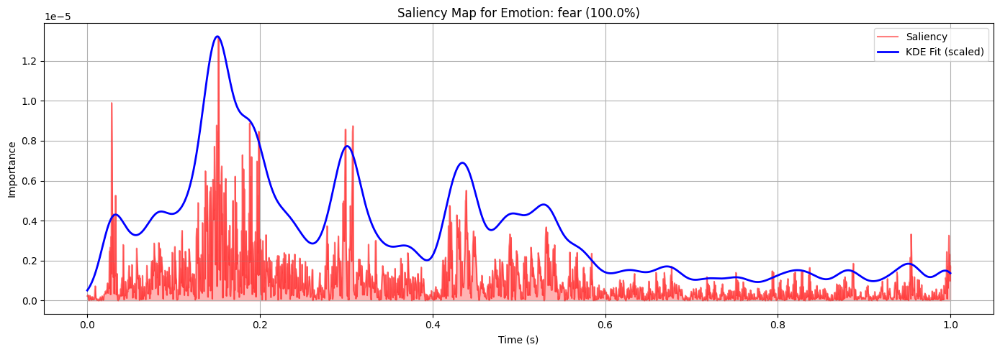

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

Predicted Emotion: fear




[{'label': 'fear', 'confidence': 0.99999475},
 {'label': 'angry', 'confidence': 0},
 {'label': 'disgust', 'confidence': 0},
 {'label': 'happy', 'confidence': 0},
 {'label': 'neutral', 'confidence': 0},
 {'label': 'sad', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [13]:
plot_saliency_map(emotion_audio_files['fear'], loaded_model, class_names)
prediction(emotion_audio_files['fear'])

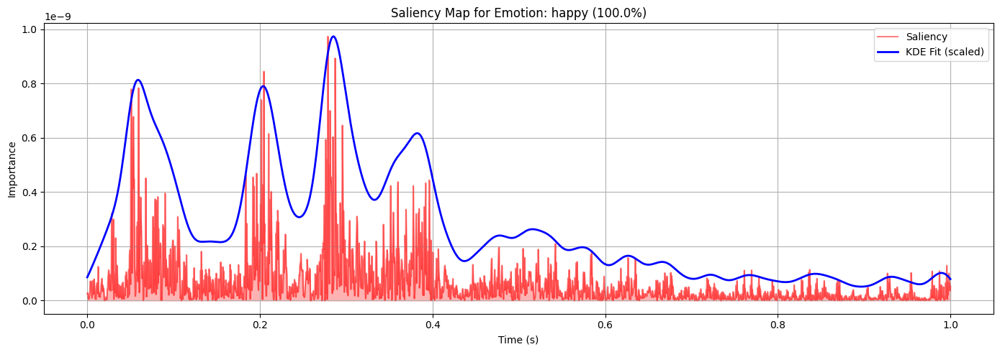

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step

Predicted Emotion: happy




[{'label': 'happy', 'confidence': 1.0},
 {'label': 'angry', 'confidence': 0},
 {'label': 'disgust', 'confidence': 0},
 {'label': 'fear', 'confidence': 0},
 {'label': 'neutral', 'confidence': 0},
 {'label': 'sad', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [14]:
plot_saliency_map(emotion_audio_files['happy'], loaded_model, class_names)
prediction(emotion_audio_files['happy'])

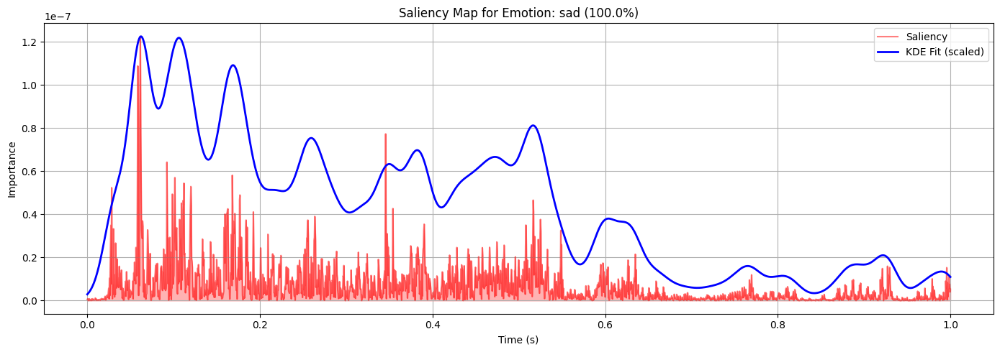

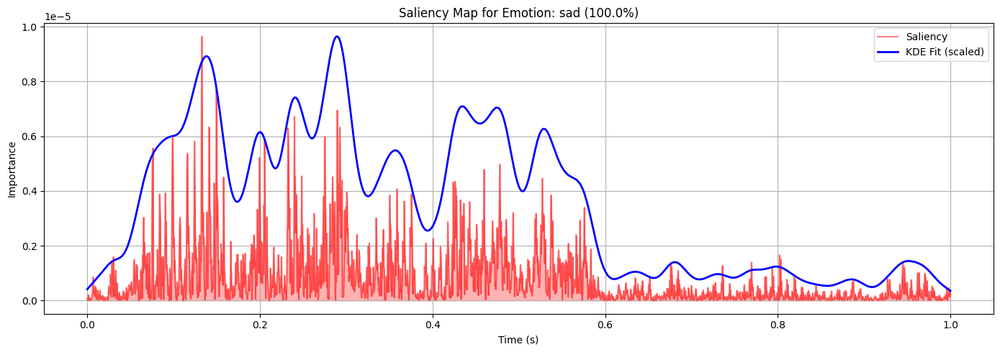

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step

Predicted Emotion: sad




[{'label': 'sad', 'confidence': 1.0},
 {'label': 'angry', 'confidence': 0},
 {'label': 'disgust', 'confidence': 0},
 {'label': 'fear', 'confidence': 0},
 {'label': 'happy', 'confidence': 0},
 {'label': 'neutral', 'confidence': 0},
 {'label': 'surprise', 'confidence': 0}]

In [15]:
plot_saliency_map(emotion_audio_files['sad'], loaded_model, class_names)
pathhh = "Datasets/VoiceActors/AudioWAV/1001_DFA_SAD_XX.wav"
plot_saliency_map(pathhh, loaded_model, class_names)
prediction(emotion_audio_files['sad'])

In [16]:
def get_all_audio_paths(base_dir, max_files_per_emotion=1):
    """
    Traverses the emotion directories and collects audio paths and emotion labels.

    Parameters:
    - base_dir: str, the path where emotion-named folders are located.
    - max_files_per_emotion: int, limit how many audio files to use per emotion.

    Returns:
    - audio_paths: list of audio file paths.
    - emotion_names: corresponding emotion names.
    """
    emotion_dirs = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    audio_paths = []
    emotion_names = []

    for emotion_dir in emotion_dirs:
        full_dir = os.path.join(base_dir, emotion_dir)
        files = [f for f in os.listdir(full_dir) if f.endswith('.wav')]
        files = files[:max_files_per_emotion]  # Limit samples

        for f in files:
            audio_paths.append(os.path.join(full_dir, f))
            # Emotion name is extracted from directory name like "YAF_angry"
            emotion_names.append(emotion_dir.split('_')[-1])

    return audio_paths, emotion_names


def plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d"):
    """
    Aggregates and plots average activation maps for each emotion from a specified CNN layer.
    """
    assert len(audio_paths) == len(emotion_names), "Mismatch between audio paths and emotion names."

    # Group audio paths by emotion using a regular dictionary
    emotion_to_paths = {}
    for path, emotion in zip(audio_paths, emotion_names):
        if emotion not in emotion_to_paths:
            emotion_to_paths[emotion] = []
        emotion_to_paths[emotion].append(path)

    unique_emotions = list(emotion_to_paths.keys())
    num_emotions = len(unique_emotions)
    cols = 2
    rows = (num_emotions + 1) // cols

    plt.figure(figsize=(12, 5 * rows))

    for i, emotion in enumerate(unique_emotions):
        paths = emotion_to_paths[emotion]
        activation_maps = []

        for path in paths:
            processed_input = get_predict_feat(path)
            activation_model = Model(inputs=loaded_model.inputs,
                                     outputs=loaded_model.get_layer(layer_name).output)
            activations = activation_model.predict(processed_input)
            activation_map = activations[0].T  # Shape: (filters, time_steps)
            activation_maps.append(activation_map)

        # Compute average activation map across all samples of this emotion
        avg_activation_map = np.mean(activation_maps, axis=0)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(avg_activation_map, aspect='auto', origin='lower', cmap='viridis')
        plt.colorbar(label='Activation Strength')
        plt.title(f"Avg Activation Map — {emotion}")
        plt.xlabel("Time Steps")
        plt.ylabel("Filter Index")

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━

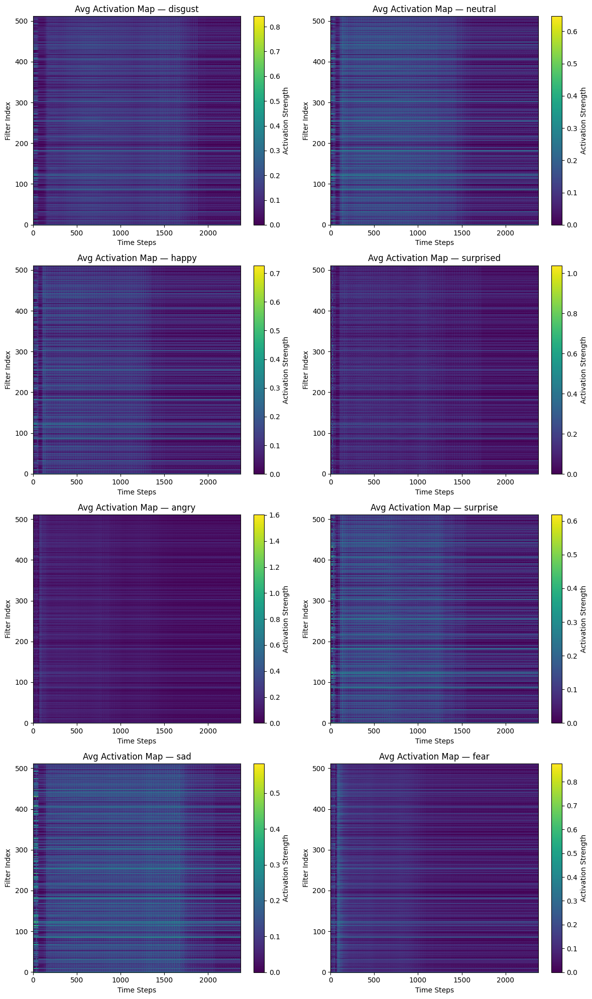

In [17]:
base_dir = "Datasets/TESS"
audio_paths, emotion_names = get_all_audio_paths(base_dir, 10)
emotion_names = [emo.lower() for emo in emotion_names]
plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

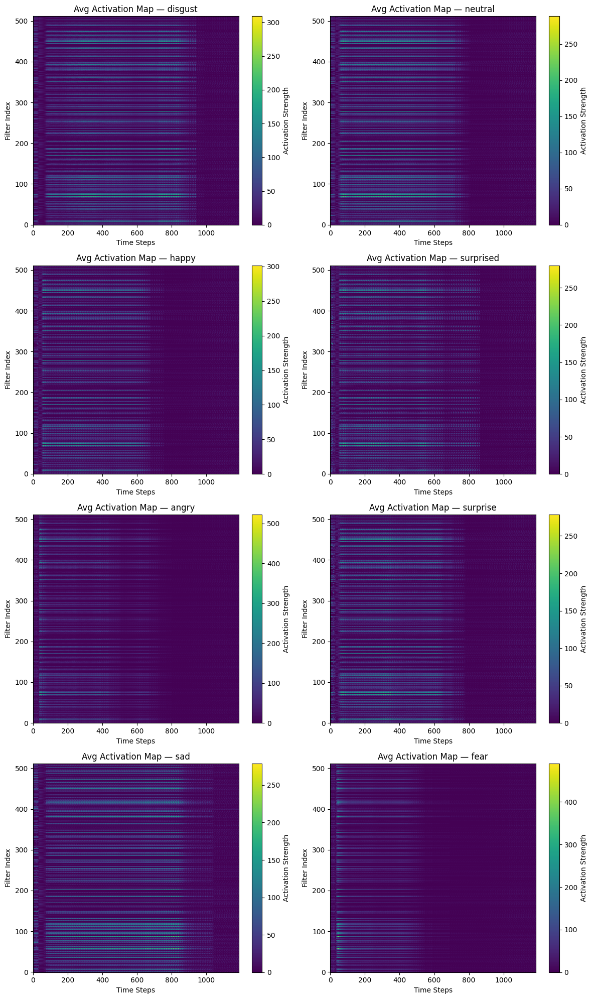

In [18]:
plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d_1")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

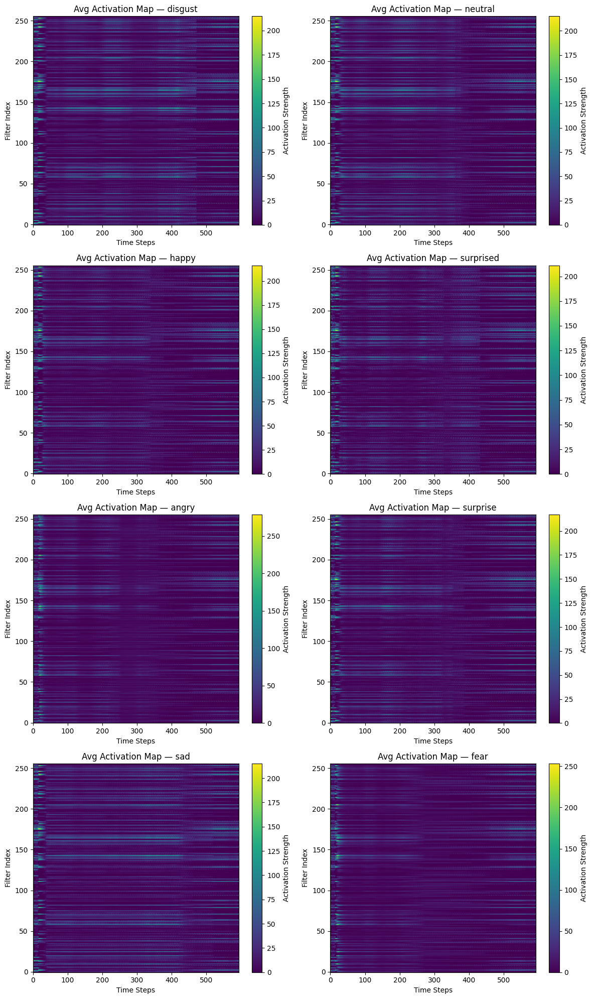

In [19]:
plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d_2")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

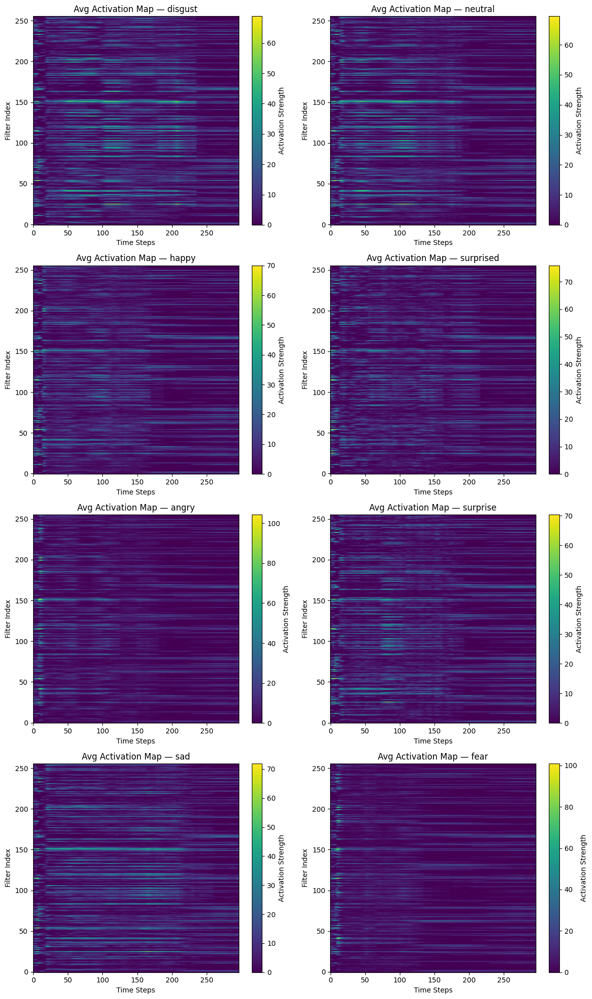

In [20]:
plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d_3")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

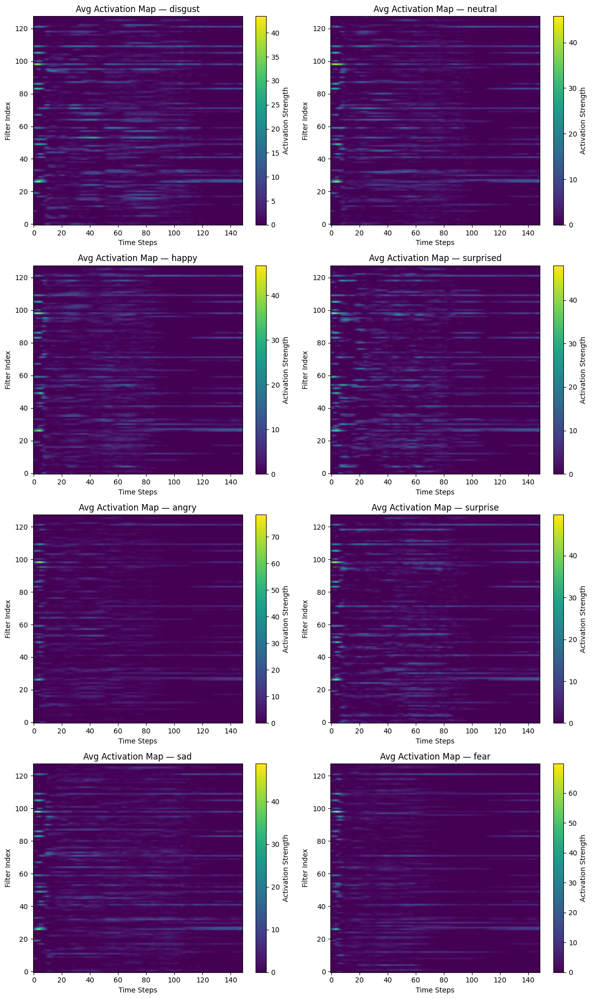

In [21]:
plot_activation_maps_2d(audio_paths, emotion_names, layer_name="conv1d_4")